In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly_express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/jigsaw-toxic-comment-classification-challenge/train.csv.zip
/kaggle/input/jigsaw-toxic-comment-classification-challenge/sample_submission.csv.zip
/kaggle/input/jigsaw-toxic-comment-classification-challenge/test_labels.csv.zip
/kaggle/input/jigsaw-toxic-comment-classification-challenge/test.csv.zip
/kaggle/input/toxic-comment-identification/valid_dls.pkl
/kaggle/input/toxic-comment-identification/__results__.html
/kaggle/input/toxic-comment-identification/lm_dls.pkl
/kaggle/input/toxic-comment-identification/test_dls.pkl
/kaggle/input/toxic-comment-identification/dls.pkl
/kaggle/input/toxic-comment-identification/__notebook__.ipynb
/kaggle/input/toxic-comment-identification/__output__.json
/kaggle/input/toxic-comment-identification/export.pkl
/kaggle/input/toxic-comment-identification/custom.css
/kaggle/input/toxic-comment-identification/models/model.pth
/kaggle/input/toxic-comment-identification/models/encoder.pth
/kaggle/input/toxic-comment-identification/__results___fil

In [2]:
df = pd.read_csv('/kaggle/input/jigsaw-toxic-comment-classification-challenge/train.csv.zip')
df.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159571 entries, 0 to 159570
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             159571 non-null  object
 1   comment_text   159571 non-null  object
 2   toxic          159571 non-null  int64 
 3   severe_toxic   159571 non-null  int64 
 4   obscene        159571 non-null  int64 
 5   threat         159571 non-null  int64 
 6   insult         159571 non-null  int64 
 7   identity_hate  159571 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 9.7+ MB


In [4]:
vocab = list(df.columns[-6:])
vocab

['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

In [5]:
#EDA

In [6]:
fig = px.histogram(df['comment_text'].apply(lambda x : len(x.split())),
                   labels={'value':'length of comments'},
                  title='Distribution of length of comments')
fig.show()

In [7]:
df['clean']=df[vocab].sum(axis=1).apply(lambda x: 1 if x==0 else 0)
df['clean'].value_counts()

1    143346
0     16225
Name: clean, dtype: int64

In [8]:
target_dist = df[vocab+['clean']].sum(axis=0).sort_values(ascending=False).to_frame('counts').reset_index()
fig = px.bar(target_dist,x='index',y='counts',color='index',text='counts',
            title='Category-wise Number of Comments ')
fig.show()

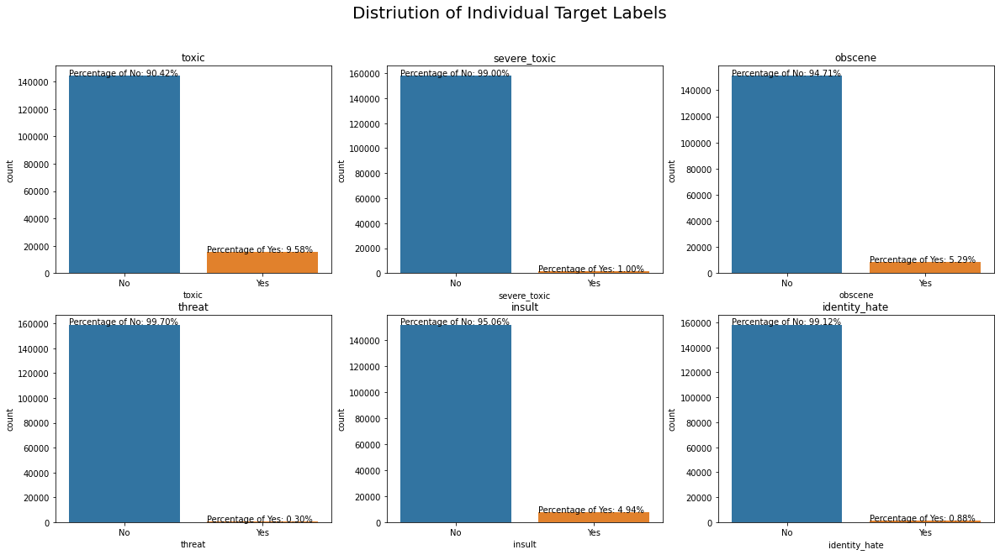

In [9]:
def plot_target_dist(df,title='Distriution of Individual Target Labels'):
    plt.figure(figsize=(20,10))
    for i,j in enumerate(vocab):
        plt.subplot(2,3,i+1)
        sns.countplot(x=df[j].map({0:'No',1:'Yes'}))
        plt.text(0.6, df[j].sum(), f'Percentage of Yes: {df[j].mean()*100:.2f}%')
        plt.text(-0.4, df[j].count()-df[j].sum() ,f'Percentage of No: {100-df[j].mean()*100:.2f}%')
        plt.title(j)
    plt.suptitle(title,fontsize=20)
    plt.show()
plot_target_dist(df)

## Inference:
- Target variables are highly imbalanced
- Thus I will use Area under precision recall curve averaged over all category labels for hyperparameter tuning and evaluating model performance 


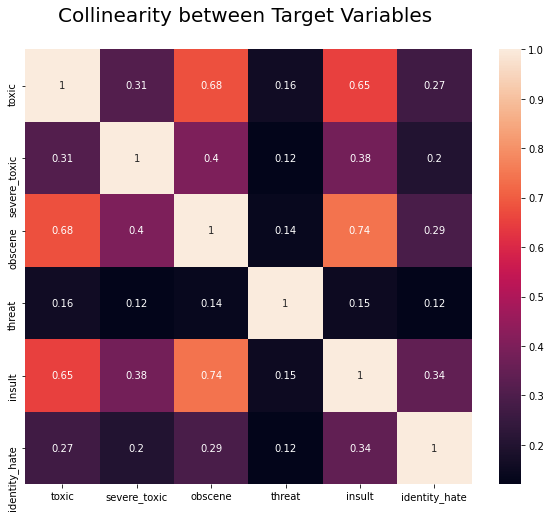

In [10]:
plt.figure(figsize=(10,8))
sns.heatmap(np.round(df[vocab].corr(),2),annot=True)
plt.title('Collinearity between Target Variables \n',fontsize=20)
plt.show()

In [11]:
df['text'] = df['comment_text']
df=df.drop('comment_text',axis=1)

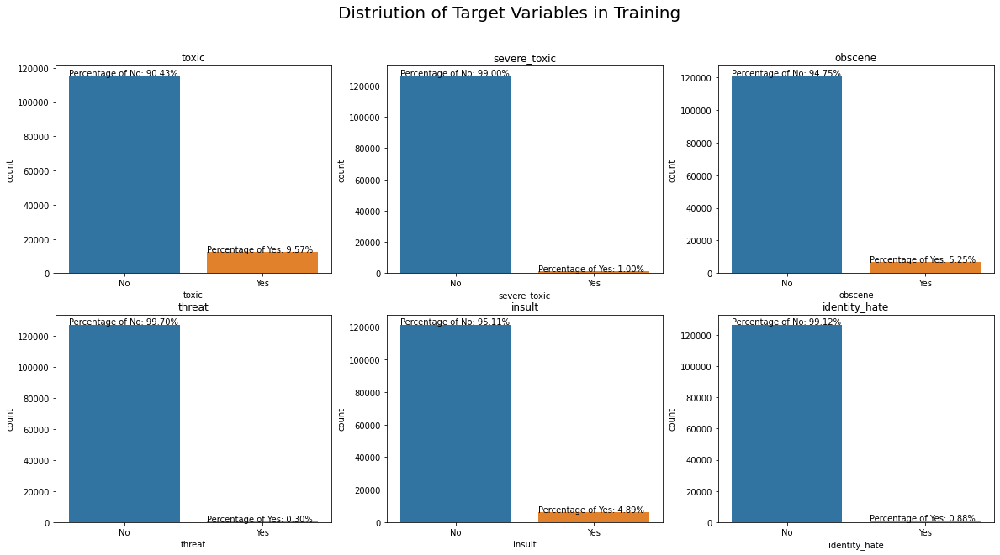

In [12]:
from sklearn.model_selection import train_test_split
seed = 10
test_size = 0.2
df_train, df_test = train_test_split(df, test_size = test_size, random_state = seed, stratify = df['threat'])
plot_target_dist(df_train,'Distriution of Target Variables in Training')

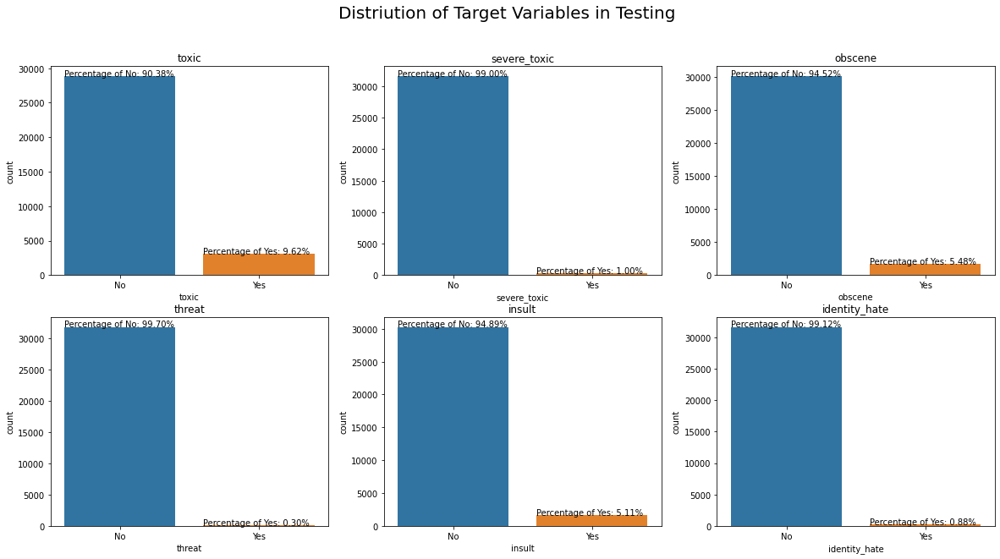

In [13]:
plot_target_dist(df_test,'Distriution of Target Variables in Testing')

In [14]:
from fastai.text.all import *

In [15]:
lm_block = DataBlock(blocks=TextBlock.from_df(text_cols='text', is_lm=True),
                    get_x=ColReader('text'),
                    splitter=RandomSplitter(seed=3))

In [16]:
lm_dls = lm_block.dataloaders(df, bs=64)

/opt/conda/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



In [17]:
torch.save(lm_dls, 'lm_dls.pkl')

In [18]:
# lm_dls = torch.load('/kaggle/input/toxic-comment-identification/lm_dls.pkl')

In [19]:
lm_dls.show_batch()

,text,text_
0,"xxbos "" \n▁ xxmaj please do not add nonsense to xxmaj wikipedia . xxmaj it is considered vandalism . xxmaj if you would like to experiment , use the sandbox . xxmaj thank you . xd ( ? ! ? ) "" xxbos "" \n xxmaj if the leaks were faked , and xxmaj i 'm not going to dispute your word that they were , why did n't you all come",""" \n▁ xxmaj please do not add nonsense to xxmaj wikipedia . xxmaj it is considered vandalism . xxmaj if you would like to experiment , use the sandbox . xxmaj thank you . xd ( ? ! ? ) "" xxbos "" \n xxmaj if the leaks were faked , and xxmaj i 'm not going to dispute your word that they were , why did n't you all come out"
1,"xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk xxmaj verde \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj will xxmaj dancer \n\n xxmaj jockeys , trainers and owners \n xxmaj ahmed xxmaj xxunk \n xxmaj xxunk xxmaj al xxmaj xxunk \n xxmaj luciano xxunk \n xxmaj antonio xxmaj xxunk \n xxmaj xxunk xxmaj xxunk \n xxmaj antonio xxmaj","\n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk xxmaj verde \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj xxunk \n xxmaj will xxmaj dancer \n\n xxmaj jockeys , trainers and owners \n xxmaj ahmed xxmaj xxunk \n xxmaj xxunk xxmaj al xxmaj xxunk \n xxmaj luciano xxunk \n xxmaj antonio xxmaj xxunk \n xxmaj xxunk xxmaj xxunk \n xxmaj antonio xxmaj xxunk"
2,"of the man 's impact when you removed these points . i implore you to restore them , as i think that they surely would meet your definition of encyclopedic , once expounded upon . xxmaj good day to you . xxbos "" \n\n▁ xxmaj move or eliminate xxmaj cast section ? \n\n xxmaj the xxmaj featured xxmaj article xxmaj review comments ( above ) suggest that the xxmaj cast section ""","the man 's impact when you removed these points . i implore you to restore them , as i think that they surely would meet your definition of encyclopedic , once expounded upon . xxmaj good day to you . xxbos "" \n\n▁ xxmaj move or eliminate xxmaj cast section ? \n\n xxmaj the xxmaj featured xxmaj article xxmaj review comments ( above ) suggest that the xxmaj cast section "" """
3,"sw xxmaj wiki has no xxup xxunk . xxmaj it goes simply - if you have new article add it , on top and change the picture . i know you have an account there . xxmaj you may also want to put xxmaj je xxmaj suis xxmaj hafspajen on it , eh , , what do you know … xxbos i was convinced by the logic and reason of your arguments","xxmaj wiki has no xxup xxunk . xxmaj it goes simply - if you have new article add it , on top and change the picture . i know you have an account there . xxmaj you may also want to put xxmaj je xxmaj suis xxmaj hafspajen on it , eh , , what do you know … xxbos i was convinced by the logic and reason of your arguments here"
4,"family name does indeed relate to only a xxunk person . xxmaj and even so , it would still be possible to write an article about the family name as such , but it 's not my interest , so i wo n't do it . xxmaj however , writing such an article would be legitimate and such an article could exist as a wikipedia article . \n\n xxmaj on the links","name does indeed relate to only a xxunk person . xxmaj and even so , it would still be possible to write an article about the family name as such , but it 's not my interest , so i wo n't do it . xxmaj however , writing such an article would be legitimate and such an article could exist as a wikipedia article . \n\n xxmaj on the links that"
5,issue is that the trajectory of the photon inside the box gets slightly curved in the gravitational field such that there is a vertical component of the photon momentum xxunk = xxunk ) where p = e / c is the momentum and theta is a very small angle . xxmaj at each collision with the vertical walls of the box the photon transmits a downward force dp = xxunk / dt,is that the trajectory of the photon inside the box gets slightly curved in the 

In [20]:
lm_learn = language_model_learner(lm_dls, AWD_LSTM, pretrained=True, metrics=[accuracy, Perplexity()])

In [21]:
lm_learn.to_fp16()

SuggestedLRs(lr_min=0.03019951581954956, lr_steep=0.0831763744354248)

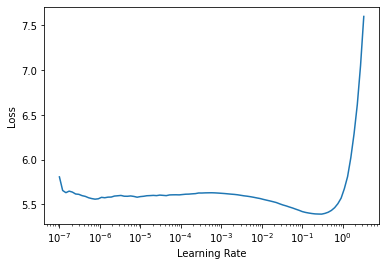

In [22]:
lm_learn.lr_find()

In [23]:
lm_learn.fit_one_cycle(n_epoch=1, lr_max=2e-2)

epoch,train_loss,valid_loss,accuracy,perplexity,time
0,4.299474,3.950034,0.311418,51.937141,15:58


In [24]:
lm_learn.unfreeze()

SuggestedLRs(lr_min=0.00036307806149125097, lr_steep=1.3182567499825382e-06)

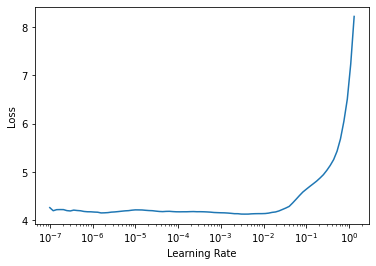

In [25]:
lm_learn.lr_find()

In [26]:
lm_learn.fit_one_cycle(n_epoch=10, lr_max=slice(1e-4,1e-2), cbs=[SaveModelCallback])

epoch,train_loss,valid_loss,accuracy,perplexity,time
0,3.925289,3.777836,0.332864,43.721329,17:15
1,3.860445,3.737526,0.338756,41.993958,17:09
2,3.745401,3.676992,0.349269,39.527325,17:22
3,3.691030,3.638309,0.353566,38.027470,17:15
4,3.518034,3.601304,0.359655,36.645973,17:10
5,3.532815,3.572526,0.362105,35.606422,17:12
6,3.447489,3.546064,0.365656,34.676559,17:10
7,3.407110,3.523900,0.368347,33.916447,17:13
8,3.335203,3.515007,0.370135,33.616158,17:10
9,3.269082,3.515909,0.370330,33.646503,17:13


Better model found at epoch 0 with valid_loss value: 3.7778360843658447.
Better model found at epoch 1 with valid_loss value: 3.737525701522827.
Better model found at epoch 2 with valid_loss value: 3.676992177963257.
Better model found at epoch 3 with valid_loss value: 3.6383087635040283.
Better model found at epoch 4 with valid_loss value: 3.6013035774230957.
Better model found at epoch 5 with valid_loss value: 3.572525978088379.
Better model found at epoch 6 with valid_loss value: 3.5460638999938965.
Better model found at epoch 7 with valid_loss value: 3.523900032043457.
Better model found at epoch 8 with valid_loss value: 3.5150067806243896.


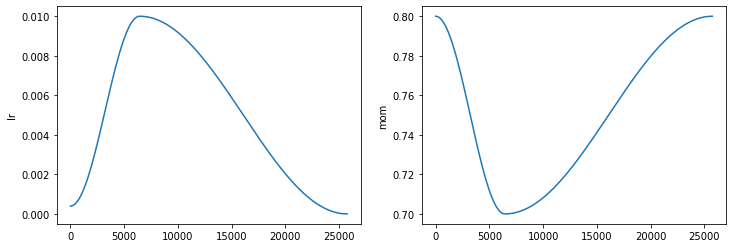

In [27]:
lm_learn.recorder.plot_sched()

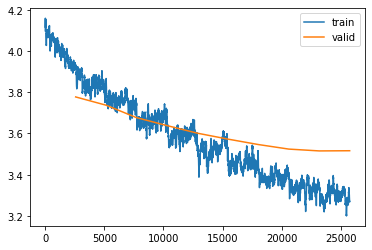

In [28]:
lm_learn.recorder.plot_loss()

In [29]:
lm_learn.validate()

(#3) [3.5150067806243896,0.3701351284980774,33.61615753173828]

In [30]:
lm_learn.save_encoder('encoder')

In [31]:
blocks = (TextBlock.from_df('text', seq_len=lm_dls.seq_len, vocab=lm_dls.vocab), 
          MultiCategoryBlock(encoded=True, vocab=vocab))

In [32]:
toxic_clas = DataBlock(blocks=blocks,
                      get_x=ColReader('text'),
                      get_y=ColReader(vocab),
                      splitter=TrainTestSplitter(test_size=0.2, random_state=3, stratify=df_train['threat']))

In [33]:
dls = toxic_clas.dataloaders(df_train)
valid_dls = dls.test_dl(dls.valid_ds.items, with_labels=True) #validation data for metric comparisions
test_dls = dls.test_dl(df_test, with_labels=True) #holdout set

/opt/conda/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



In [34]:
torch.save(dls, 'dls.pkl')
torch.save(valid_dls, 'valid_dls.pkl')
torch.save(test_dls, 'test_dls.pkl')

In [35]:
# dls=torch.load('/kaggle/input/toxic-comment-identification/dls.pkl')

In [36]:
dls.show_batch()

,text,None
0,xxbos xxmaj take that ! \n\n xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass xxup in xxup the xxup ass,toxic;severe_toxic;obscene
1,xxbos xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup fat xxup jew xxup,toxic;insult;identity_hate
2,xxbos xxup fuck xxup your xxup dog \n\n xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your xxup dog xxup fuck xxup your,toxic;severe_toxic;obscene;insult
3,"xxbos "" \n\n▁ xxup unblock xxup me xxup you xxup xxunk ! \n\n { { xxunk xxrep 3 ! \n\n xxmaj one of my favorite and most vivid memories was of a party i attended in high school . xxmaj it was near the end of the year , and everyone was letting loose . xxmaj the party had not gotten too badly out of control , and was finally winding down . \n\n i was dating xxmaj karen at the time . xxmaj we 'd been going out for about six months . xxmaj we knew our time together was growing short since we 'd soon be heading off to college , she to xxmaj radcliffe , and i to xxmaj johns xxmaj hopkins . xxmaj we were taking every chance we could to be intimate . xxmaj i 'd been with a few girls before , but xxmaj",toxic;obscene;insult
4,"xxbos i hate you \n\n = = \n\n xxmaj brothers and sisters , xxmaj in this great nation we are united under peace and war . xxmaj it is that war is peace and peace is war ? xxmaj we live together we work together , we live together . we are united by one common goal ? xxmaj that goal is peace . i give you peace . i give you food , clothes , and shelter . i xxup am xxup big xxup brother ! i xxup am xxup xxunk xxup u ? you . xxmaj in this peace there are no inpure thoughts ? xxmaj only thoughts of peace and victory over the enemy . xxmaj help the war effort againt the enemy . xxmaj to fight the enemy is to not think inpure thoughts . xxmaj think happy happy . xxmaj happy xxwrep 4 happy good",toxic
5,"xxbos "" \n\n xxmaj maybe we can mention the city known xxmaj xxunk like xxmaj dr . xxmaj xxunk , xxmaj dr . xxmaj xxunk , xxmaj dr . xxmaj xxunk , xxmaj dr . xxmaj xxunk , xxmaj dr . xxmaj xxunk , xxmaj dr . xxmaj xxunk , the most powerful xxmaj mullah after the revolution , … ? \n\n xxmaj dear xxmaj xxunk , \n\n i made those changes , and stand for them , because of the following : \n▁ xxmaj y

In [37]:
weights=[5.]*len(vocab)
# for i in vocab:
#     neg, pos = list(df_train[i].value_counts())
#     weights.append(neg/pos)
pos_weight = torch.tensor(weights).to('cuda')
pos_weight

tensor([5., 5., 5., 5., 5., 5.], device='cuda:0')

In [38]:
metrics = [APScoreMulti()]
loss = BCEWithLogitsLossFlat(pos_weight=pos_weight)
learn = text_classifier_learner(dls, AWD_LSTM, metrics=metrics, loss_func=loss, wd=0.1)

In [39]:
learn.load_encoder('/kaggle/input/toxic-comment-identification/models/encoder');

SuggestedLRs(lr_min=0.06309573650360108, lr_steep=0.0831763744354248)

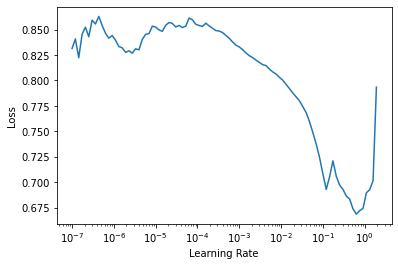

In [40]:
learn.lr_find()

In [41]:
learn.fit_one_cycle(1, 2e-2)

epoch,train_loss,valid_loss,average_precision_score,time
0,0.165961,0.161209,0.513785,03:33


In [42]:
learn.freeze_to(-2)
learn.fit_one_cycle(1, slice(1e-2/(2.6**4),1e-2))

epoch,train_loss,valid_loss,average_precision_score,time
0,0.130546,0.117597,0.625216,03:49


In [43]:
learn.freeze_to(-3)
learn.fit_one_cycle(1, slice(5e-3/(2.6**4),5e-3))

epoch,train_loss,valid_loss,average_precision_score,time
0,0.111648,0.101819,0.658599,04:39


In [44]:
learn.unfreeze()
learn.fit_one_cycle(5, slice(1e-3/(2.6**4),1e-3),  cbs=[SaveModelCallback])

epoch,train_loss,valid_loss,average_precision_score,time
0,0.093836,0.100460,0.667988,05:39
1,0.095420,0.098609,0.677856,05:39
2,0.083138,0.097343,0.683941,05:39
3,0.080144,0.099365,0.685483,05:42
4,0.076501,0.099683,0.685702,05:42


Better model found at epoch 0 with valid_loss value: 0.10045982897281647.
Better model found at epoch 1 with valid_loss value: 0.09860914945602417.
Better model found at epoch 2 with valid_loss value: 0.09734328836202621.


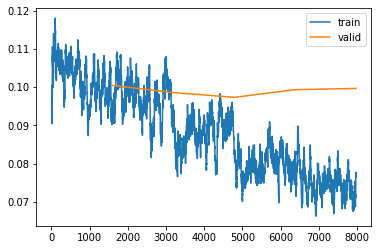

In [45]:
learn.recorder.plot_loss()

In [46]:
learn.validate(dl=valid_dls)

(#2) [0.09734328836202621,0.6839406292262424]

In [47]:
learn.export()

In [48]:
preds_prob, targs = learn.get_preds(dl=valid_dls)
preds_prob = np.array(preds_prob)
targs = np.array(targs).astype(int)

In [49]:
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix
from sklearn.metrics import classification_report, f1_score, recall_score, precision_score, ConfusionMatrixDisplay

In [50]:
def plot_pr_curve(y_true, y_pred_prob, label_name): #plots precision recall curve and gives the labels correspinding to best thresholds ( at best f1 score )
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_prob)
    numerator = 2 * recall * precision
    denom = recall + precision
    f1_scores = np.divide(numerator, denom, out=np.zeros_like(denom), where=(denom!=0)) #f1 scores at each thresh
    prauc = np.round(average_precision_score(y_true, y_pred_prob),2) 
    
    fig = make_subplots(1,2,subplot_titles=['Precision Vs Recall', 'PRF Vs Threshold'])   
    fig.add_trace(go.Scatter(x=recall, y=precision, name='P vs R'),1,1)
    fig.update_xaxes(title='Recall', row=1,col=1)
    fig.update_yaxes(title='Precision', row=1,col=1)
    fig.update_layout(title=f'Target Column Name: {label_name}   ###   Area Under Precision-Recall Curve: {prauc}',hovermode="x")
    

    fig.add_trace(go.Scatter(x=thresholds, y=f1_scores[:-1], name='F1 Score'),1,2)
    fig.add_trace(go.Scatter(x=thresholds, y=recall[:-1], name='Recall'),1,2)
    fig.add_trace(go.Scatter(x=thresholds, y=precision[:-1], name='Precision'),1,2)
    fig.update_xaxes(title='Thresholds', row=1,col=2)
    fig.update_yaxes(title='Precision F1 Recall',row=1,col=2)
    
    
    best_thresh = thresholds[np.argmax(f1_scores)] #threshold tuning for best f1 score
    
    fig.add_annotation(x=recall[np.argmax(f1_scores)], y=precision[np.argmax(f1_scores)], xref='x1', yref='y1',
            text=f"best F1 score",
            showarrow=True,
            arrowhead=1)
    
    fig.add_annotation(x=best_thresh, y=max(f1_scores), xref='x2', yref='y2',
            text=f"best F1 score",
            showarrow=True,
            arrowhead=1) 
    
    fig.show()
    
    return best_thresh


In [51]:
best_threshs = []
for i,j in enumerate(vocab):
    y_true = targs[:,i]
    y_pred_prob = preds_prob[:,i]
    thresh = plot_pr_curve(y_true, y_pred_prob, j)
    best_threshs.append(thresh)

In [52]:
best_threshs = np.array(best_threshs)
best_threshs

array([0.7968193 , 0.6824051 , 0.8263804 , 0.66129655, 0.70081073,
       0.7603816 ], dtype=float32)

In [53]:
preds = (preds_prob>=best_threshs).astype(int)
print(classification_report(targs, preds, zero_division=0, target_names=vocab))

               precision    recall  f1-score   support

        toxic       0.83      0.81      0.82      2417
 severe_toxic       0.44      0.62      0.52       239
      obscene       0.85      0.82      0.83      1348
       threat       0.45      0.50      0.48        76
       insult       0.71      0.83      0.76      1276
identity_hate       0.54      0.62      0.58       225

    micro avg       0.76      0.80      0.78      5581
    macro avg       0.64      0.70      0.66      5581
 weighted avg       0.77      0.80      0.78      5581
  samples avg       0.07      0.07      0.07      5581



In [54]:
def show_conf_matrix(targs,preds):
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,10))

    for i, ax in enumerate(axes.flatten()):
        disp = ConfusionMatrixDisplay(confusion_matrix(targs[:,i],preds[:,i]))
        disp.plot(ax=ax,cmap='Blues',colorbar=False) 
        ax.title.set_text(f'Confusion Matrix for {vocab[i]}')   
    plt.suptitle('Confusion Matrices', fontsize=16)
    plt.tight_layout()
    plt.show()

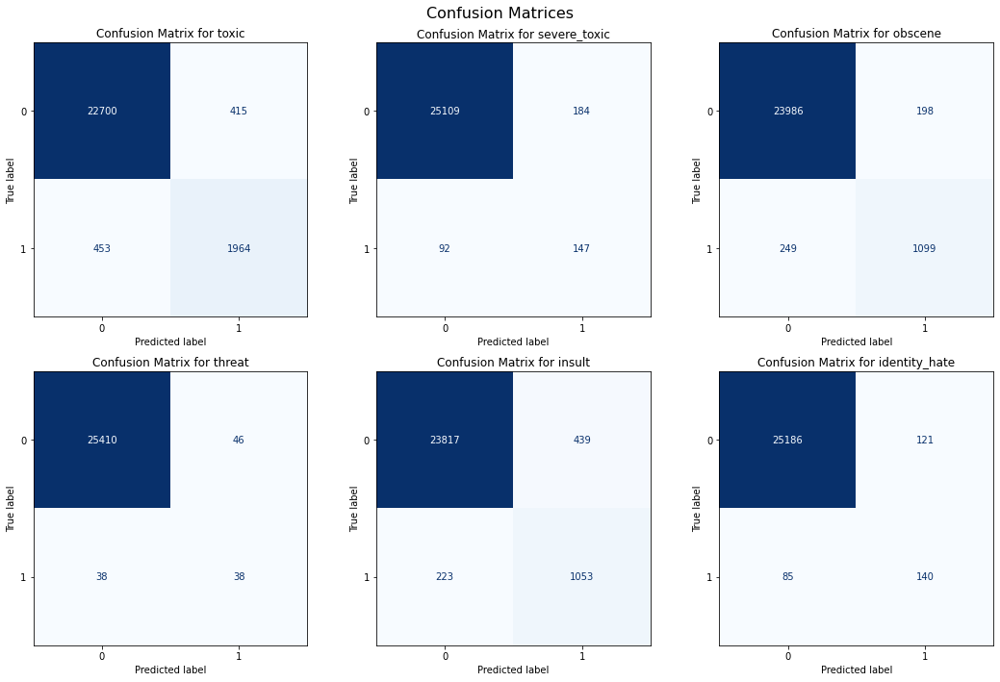

In [55]:
show_conf_matrix(targs,preds)

In [56]:
preds_prob, targs = learn.get_preds(dl=test_dls)
preds_prob = np.array(preds_prob)
targs = np.array(targs).astype(int)

In [57]:
preds = (preds_prob>=best_threshs).astype(int)
print(classification_report(targs, preds, zero_division=0, target_names=vocab))

               precision    recall  f1-score   support

        toxic       0.83      0.82      0.82      3071
 severe_toxic       0.48      0.58      0.53       318
      obscene       0.85      0.81      0.83      1748
       threat       0.47      0.59      0.52        96
       insult       0.71      0.84      0.77      1632
identity_hate       0.50      0.57      0.53       280

    micro avg       0.76      0.80      0.78      7145
    macro avg       0.64      0.70      0.67      7145
 weighted avg       0.77      0.80      0.78      7145
  samples avg       0.07      0.07      0.07      7145



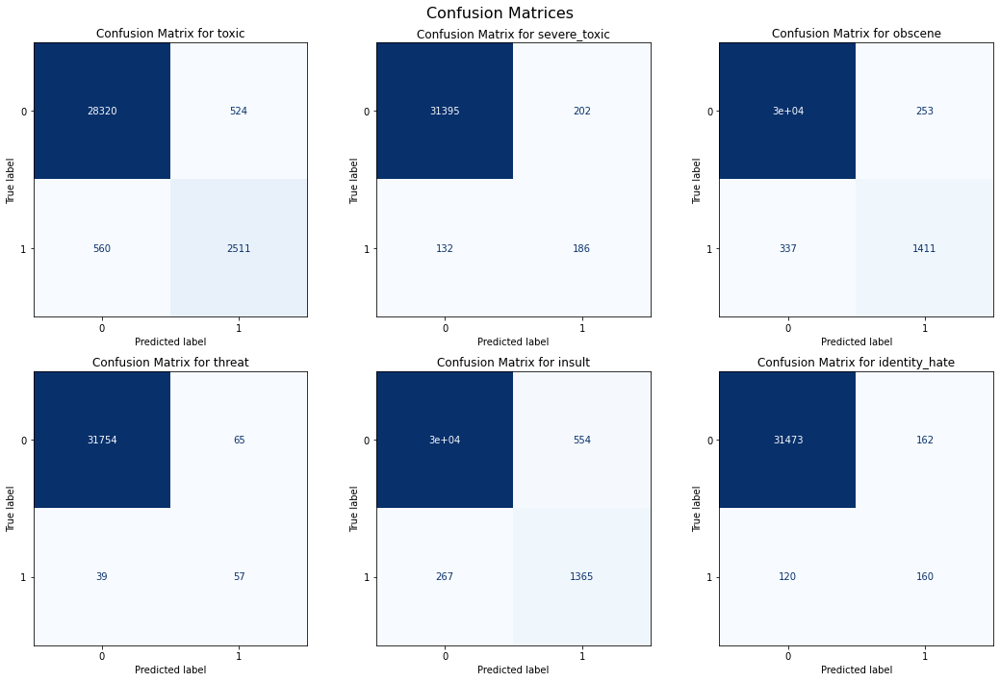

In [58]:
show_conf_matrix(targs,preds)